# Klasifikasi dan Segmentasi Citra Pemutihan Terumbu Karang

In [1]:
# Download Dataset NOAA dari google drive
# Install gdown versi terbaru agar bypass kuota download drive aman
!pip install --upgrade gdown

# 2. Definisikan ID file dari Google Drive kamu
import gdown
import zipfile
import os

file_id = '1JmpeZrGyUD9tte47Mf201Zw0PxR0YAql' # <-- Ganti dengan ID file asli kamu
url = f'https://drive.google.com/uc?id={file_id}'
output = 'noaa-coral.zip'

# 3. Download file
gdown.download(url, output, quiet=False)

  Attempting uninstall: gdown
    Found existing installation: gdown 5.2.1
    Uninstalling gdown-5.2.1:
      Successfully uninstalled gdown-5.2.1


Downloading...
From (original): https://drive.google.com/uc?id=1JmpeZrGyUD9tte47Mf201Zw0PxR0YAql
From (redirected): https://drive.google.com/uc?id=1JmpeZrGyUD9tte47Mf201Zw0PxR0YAql&confirm=t&uuid=c6097fab-3727-4a52-8507-5608dae8b981
To: /kaggle/working/noaa-coral.zip
100%|██████████| 746M/746M [00:10<00:00, 73.2MB/s] 


'noaa-coral.zip'

In [2]:
from kaggle_secrets import UserSecretsClient

# Mengambil token hugging face
user_secrets = UserSecretsClient()
secret_value_0 = user_secrets.get_secret("HF_TOKEN")

## 1. Dataset

In [3]:
# Install library datasets huggingface
!pip install datasets huggingface_hub -q

In [4]:
# Import library
import glob
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from PIL import Image
from datasets import load_dataset

- Dataset Coralscapes

In [5]:
# Load Dataset
coralscapes = load_dataset("EPFL-ECEO/coralscapes")

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00009.parquet:   0%|          | 0.00/472M [00:00<?, ?B/s]

data/train-00001-of-00009.parquet:   0%|          | 0.00/448M [00:00<?, ?B/s]

data/train-00002-of-00009.parquet:   0%|          | 0.00/505M [00:00<?, ?B/s]

data/train-00003-of-00009.parquet:   0%|          | 0.00/444M [00:00<?, ?B/s]

data/train-00004-of-00009.parquet:   0%|          | 0.00/469M [00:00<?, ?B/s]

data/train-00005-of-00009.parquet:   0%|          | 0.00/415M [00:00<?, ?B/s]

data/train-00006-of-00009.parquet:   0%|          | 0.00/504M [00:00<?, ?B/s]

data/train-00007-of-00009.parquet:   0%|          | 0.00/520M [00:00<?, ?B/s]

data/train-00008-of-00009.parquet:   0%|          | 0.00/498M [00:00<?, ?B/s]

data/validation-00000-of-00001.parquet:   0%|          | 0.00/406M [00:00<?, ?B/s]

data/test-00000-of-00003.parquet:   0%|          | 0.00/421M [00:00<?, ?B/s]

data/test-00001-of-00003.parquet:   0%|          | 0.00/393M [00:00<?, ?B/s]

data/test-00002-of-00003.parquet:   0%|          | 0.00/358M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/1517 [00:00<?, ? examples/s]

Generating validation split:   0%|          | 0/166 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/392 [00:00<?, ? examples/s]

In [6]:
coralscapes

DatasetDict({
    train: Dataset({
        features: ['image', 'label'],
        num_rows: 1517
    })
    validation: Dataset({
        features: ['image', 'label'],
        num_rows: 166
    })
    test: Dataset({
        features: ['image', 'label'],
        num_rows: 392
    })
})

- Dataset NOAA

In [7]:
# Unzip dataset ke direktori kerja Kaggle
print("Mengextract file...")
with zipfile.ZipFile(output, 'r') as zip_ref:
    zip_ref.extractall('/kaggle/working/noaa-coral')

print("Selesai! Dataset siap digunakan.")
# Cek isi folder
print(os.listdir('/kaggle/working/noaa-coral'))

Mengextract file...
Selesai! Dataset siap digunakan.
['noaa-coral']


## 2. Data Understanding



- Dataset CoralScapes

In [8]:
# Melihat sample dataset
sample = coralscapes['train'][0]
sample

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=2048x1024>,
 'label': <PIL.PngImagePlugin.PngImageFile image mode=L size=2048x1024>}

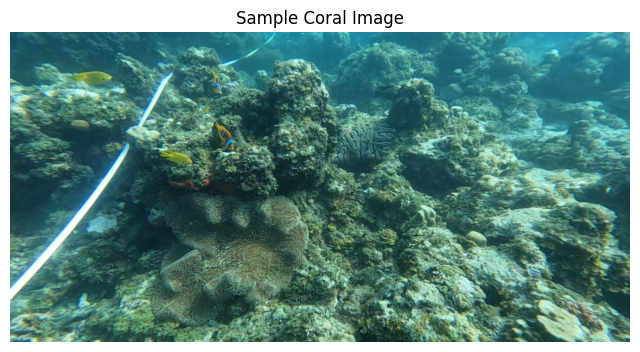

In [9]:
image = sample['image']

plt.figure(figsize=(8,6))
plt.imshow(image)
plt.title("Sample Coral Image")
plt.axis("off")
plt.show()

In [10]:
sample.keys()

dict_keys(['image', 'label'])

In [11]:
# Melihat jumlah data
print("Jumlah data train :", len(coralscapes['train']))

if 'test' in coralscapes:
    print("Jumlah data test :", len(coralscapes['test']))

Jumlah data train : 1517
Jumlah data test : 392


In [12]:
# Melihat size gambar
sizes = []

for i in range(20):
    img = coralscapes['train'][i]['image']
    sizes.append(img.size)

sizes[:10]

[(2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024),
 (2048, 1024)]

In [13]:
# Distribusi resolusi gambar
widths = [s[0] for s in sizes]
heights = [s[1] for s in sizes]

df_size = pd.DataFrame({
    'width': widths,
    'height': heights
})

df_size.describe()

,width,height
count,20.0,20.0
mean,2048.0,1024.0
std,0.0,0.0
min,2048.0,1024.0
25%,2048.0,1024.0
50%,2048.0,1024.0
75%,2048.0,1024.0
max,2048.0,1024.0


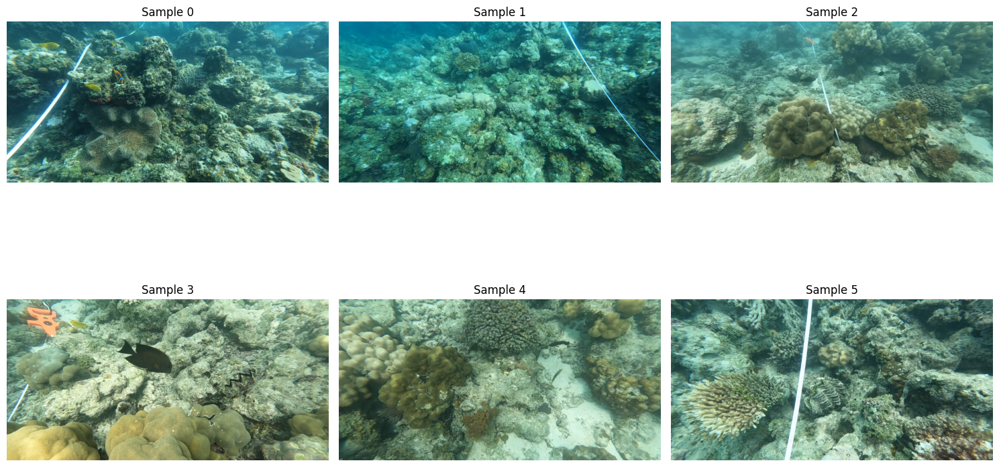

In [14]:
# Visualisasi beberapa sample
fig, axes = plt.subplots(2, 3, figsize=(15,10))

for idx, ax in enumerate(axes.flatten()):
    img = coralscapes['train'][idx]['image']
    ax.imshow(img)
    ax.set_title(f"Sample {idx}")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [15]:
# Fitur dataset
coralscapes['train'].features

{'image': Image(mode=None, decode=True),
 'label': Image(mode=None, decode=True)}

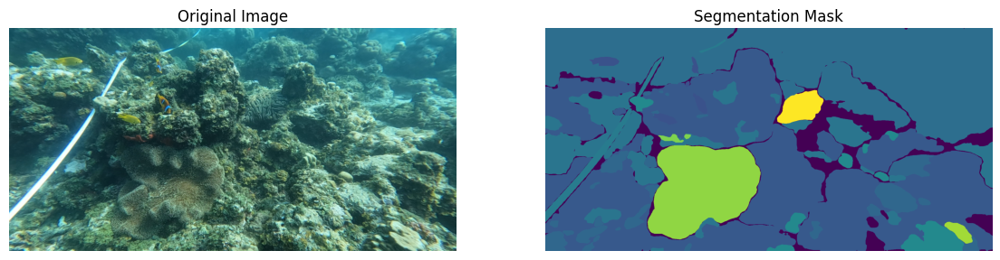

In [16]:
# Visualisasi Mask
sample = coralscapes['train'][0]

image = sample['image']
mask = sample['label']

fig, ax = plt.subplots(1, 2, figsize=(14,6))

ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(mask)
ax[1].set_title("Segmentation Mask")
ax[1].axis("off")

plt.show()

* Dataset NOAA

Eksplorasi Dataset NOAA sama seperti dataset CoralScapes diatas yang meliputi analisis struktur direktori, menghitung jumlah sampel per split (`train`, `val`, `test`), mengecek resolusi gambar, dan menampilkan sampel citra dari kelas `CORAL` dan `CORAL_BL`.

In [17]:
# Load Dataset
noaa = "/kaggle/working/noaa-coral/noaa-coral"

In [18]:
# Definisikan split dan kelas sesuai struktur direktori kamu
splits = ['train', 'val', 'test']
classes = ['CORAL', 'CORAL_BL']

In [19]:
data_distribution = []

print("Menghitung Data NOAA")
for split in splits:
    for cls in classes:
        # Mencari semua file gambar di dalam subfolder
        search_path = os.path.join(noaa, split, cls, "*.*")
        file_list = glob.glob(search_path)

        # Filter hanya file gambar (jpg, jpeg, png)
        image_list = [f for f in file_list if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        count = len(image_list)

        data_distribution.append({
            'Split': split,
            'Class': 'Healthy (CORAL)' if cls == 'CORAL' else 'Bleached (CORAL_BL)',
            'Count': count
        })
        print(f"[{split.upper()}] Kelas {cls}: {count} gambar")

df_dist = pd.DataFrame(data_distribution)

Menghitung Data NOAA
[TRAIN] Kelas CORAL: 4541 gambar
[TRAIN] Kelas CORAL_BL: 2751 gambar
[VAL] Kelas CORAL: 973 gambar
[VAL] Kelas CORAL_BL: 589 gambar
[TEST] Kelas CORAL: 974 gambar
[TEST] Kelas CORAL_BL: 591 gambar


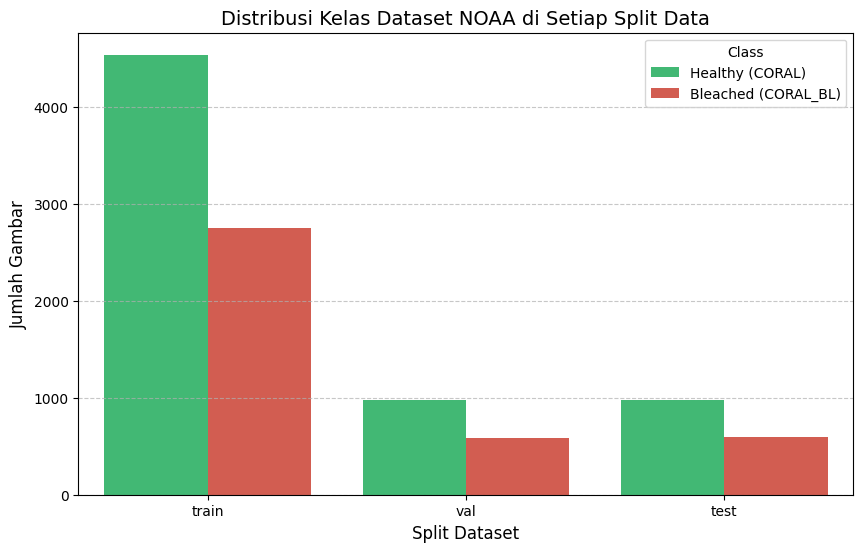

In [20]:
# Visualisasi Distribusi
plt.figure(figsize=(10, 6))
sns.barplot(data=df_dist, x='Split', y='Count', hue='Class', palette=['#2ECC71', '#E74C3C'])
plt.title('Distribusi Kelas Dataset NOAA di Setiap Split Data', fontsize=14)
plt.xlabel('Split Dataset', fontsize=12)
plt.ylabel('Jumlah Gambar', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [21]:
# Mengecek Resolusi Dataset NOAA
noaa_sizes = []
# Ambil 30 sampel acak dari folder train/CORAL untuk analisis dimensi awal
sample_paths = glob.glob(os.path.join(noaa, 'train', 'CORAL', "*.*"))[:30]

for p in sample_paths:
    if p.lower().endswith(('.png', '.jpg', '.jpeg')):
        with Image.open(p) as img:
            noaa_sizes.append(img.size)

df_noaa_size = pd.DataFrame({
    'Width': [s[0] for s in noaa_sizes],
    'Height': [s[1] for s in noaa_sizes]
})

print("Karakteristik Ukuran Gambar NOAA (Sampel):")
display(df_noaa_size.describe())

Karakteristik Ukuran Gambar NOAA (Sampel):


,Width,Height
count,30.0,30.0
mean,224.0,224.0
std,0.0,0.0
min,224.0,224.0
25%,224.0,224.0
50%,224.0,224.0
75%,224.0,224.0
max,224.0,224.0


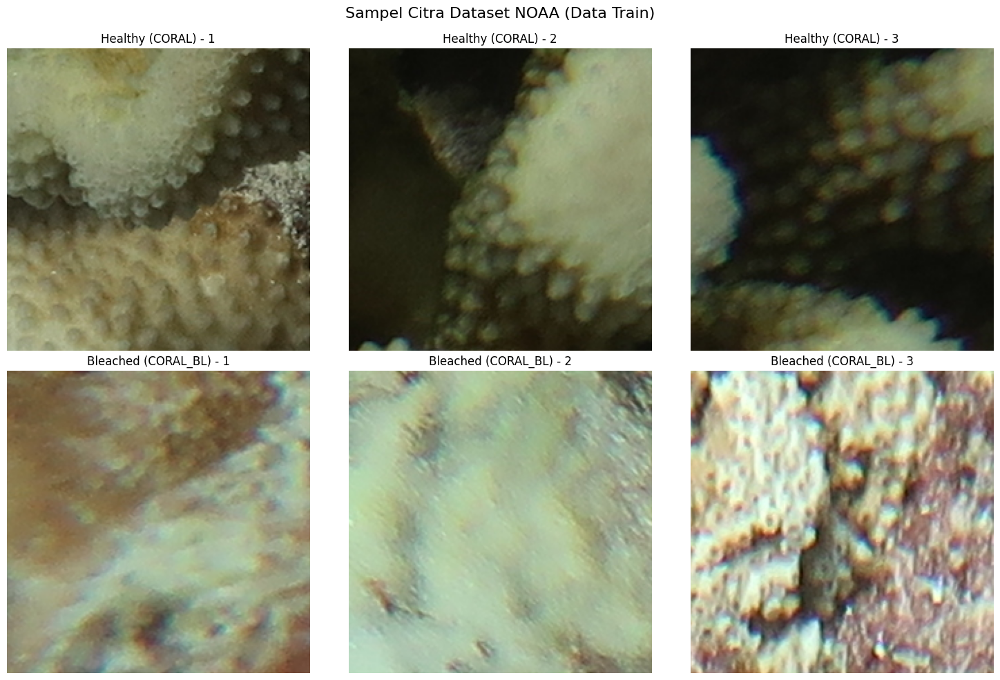

In [22]:
# Menampilkan sample
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle("Sampel Citra Dataset NOAA (Data Train)", fontsize=16)

# Ambil 3 gambar dari masing-masing kelas
healthy_train_samples = sorted(glob.glob(os.path.join(noaa, 'train', 'CORAL', "*.*")))[:3]
bleached_train_samples = sorted(glob.glob(os.path.join(noaa, 'train', 'CORAL_BL', "*.*")))[:3]

# Tampilkan Healthy (Baris Atas)
for i, img_path in enumerate(healthy_train_samples):
    img = Image.open(img_path)
    axes[0, i].imshow(img)
    axes[0, i].set_title(f"Healthy (CORAL) - {i+1}")
    axes[0, i].axis('off')

# Tampilkan Bleached (Baris Bawah)
for i, img_path in enumerate(bleached_samples := bleached_train_samples):
    img = Image.open(img_path)
    axes[1, i].imshow(img)
    axes[1, i].set_title(f"Bleached (CORAL_BL) - {i+1}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

## 3. Data Preparation

Tahapan ini meliputi:
1. **Load Data NOAA:** Memuat gambar dari folder `train`, `val`, dan `test/set` serta me-resize ke ukuran standar.
2. **Crop & Ekstrak Coralscapes (Stage 1):** Menggunakan *masking* untuk mengambil area terumbu karang saja.
3. **Integrasi & Splitting:** Membagi hasil crop Coralscapes dan menggabungkannya ke dalam split NOAA.
4. **Normalisasi:** Mengubah skala nilai piksel menjadi 0-1 (Float32).

In [23]:
# Import library yang dibutuhkan
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
import gc
import random

In [24]:
# Menentukan ukuran gambar
IMG_SIZE = (128, 128)

def load_noaa_split(base_path, split_name):
    X, y = [], []
    classes = {'CORAL': 0, 'CORAL_BL': 1} # 0 untuk Healthy, 1 untuk Bleached

    for cls_name, label in classes.items():
        folder_path = os.path.join(base_path, split_name, cls_name, "*.*")
        for img_path in glob.glob(folder_path):
            if img_path.lower().endswith(('.png', '.jpg', '.jpeg')):
                img = cv2.imread(img_path)
                if img is not None:
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                    img = cv2.resize(img, IMG_SIZE)
                    X.append(img)
                    y.append(label)
    return np.array(X), np.array(y)

print("Loading NOAA Dataset...")
X_noaa_train, y_noaa_train = load_noaa_split(noaa, 'train')
X_noaa_val, y_noaa_val = load_noaa_split(noaa, 'val')
X_noaa_test, y_noaa_test = load_noaa_split(noaa, 'test')

print(f"NOAA Train: {X_noaa_train.shape[0]} | Val: {X_noaa_val.shape[0]} | Test: {X_noaa_test.shape[0]}")

Loading NOAA Dataset...
NOAA Train: 7292 | Val: 1562 | Test: 1565


In [25]:
# Mapping id dataset CoralScapes
id2label = {
  1: "seagrass",
  2: "trash",
  3: "other coral dead",
  4: "other coral bleached",
  5: "sand",
  6: "other coral alive",
  7: "human",
  8: "transect tools",
  9: "fish",
  10: "algae covered substrate",
  11: "other animal",
  12: "unknown hard substrate",
  13: "background",
  14: "dark",
  15: "transect line",
  16: "massive/meandering bleached",
  17: "massive/meandering alive",
  18: "rubble",
  19: "branching bleached",
  20: "branching dead",
  21: "millepora",
  22: "branching alive",
  23: "massive/meandering dead",
  24: "clam",
  25: "acropora alive",
  26: "sea cucumber",
  27: "turbinaria",
  28: "table acropora alive",
  29: "sponge",
  30: "anemone",
  31: "pocillopora alive",
  32: "table acropora dead",
  33: "meandering bleached",
  34: "stylophora alive",
  35: "sea urchin",
  36: "meandering alive",
  37: "meandering dead",
  38: "crown of thorn",
  39: "dead clam"
}


In [26]:
# Menentukan ukuran gambar
IMG_SIZE = (128, 128)

# Fungsi untuk mengekstrak crop dari dataset CoralScapes
def extract_capped_crops_from_hf(hf_splits, target_size=IMG_SIZE, healthy_cap=4000, seed=42):
    """
    Ekstrak crop dari beberapa split HF sekaligus, dengan reservoir sampling
    untuk Healthy (supaya nggak pernah nyimpen lebih dari healthy_cap di memory),
    dan ambil semua Bleached (karena jumlahnya sedikit, aman disimpan semua).
    """
    random.seed(seed)
    bleached_ids = [4, 16, 19, 33]
    healthy_ids = [6, 17, 22, 25, 28, 31, 34, 36]

    X_bleached, y_bleached = [], []  # ambil semua, list ini kecil (~1734 max)

    # Reservoir untuk Healthy — ukuran tetap = healthy_cap
    X_healthy_reservoir = [None] * healthy_cap
    healthy_seen_count = 0  # total Healthy yang sudah "dilihat" (bukan disimpan)

    for hf_split in hf_splits:
        for item in hf_split:
            img = np.array(item['image'])
            mask = np.array(item['label'])

            # Bleached: simpan semua
            for pixel_val in bleached_ids:
                binary_mask = (mask == pixel_val).astype(np.uint8) * 255
                contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                for cnt in contours:
                    x, y, w, h = cv2.boundingRect(cnt)
                    if w > 40 and h > 40:
                        crop = cv2.resize(img[y:y+h, x:x+w], target_size)
                        X_bleached.append(crop)
                        y_bleached.append(1)

            # Healthy: reservoir sampling, RAM-nya nggak pernah lewat healthy_cap
            for pixel_val in healthy_ids:
                binary_mask = (mask == pixel_val).astype(np.uint8) * 255
                contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                for cnt in contours:
                    x, y, w, h = cv2.boundingRect(cnt)
                    if w > 40 and h > 40:
                        crop = cv2.resize(img[y:y+h, x:x+w], target_size)
                        if healthy_seen_count < healthy_cap:
                            X_healthy_reservoir[healthy_seen_count] = crop
                        else:
                            j = random.randint(0, healthy_seen_count)
                            if j < healthy_cap:
                                X_healthy_reservoir[j] = crop
                        healthy_seen_count += 1

        # Bebasin reference ke split yang udah selesai diproses
        gc.collect()

    n_healthy_kept = min(healthy_seen_count, healthy_cap)
    X_healthy = X_healthy_reservoir[:n_healthy_kept]
    y_healthy = [0] * n_healthy_kept

    X_cs_capped = np.array(X_bleached + X_healthy)
    y_cs_capped = np.array(y_bleached + y_healthy)

    print(f"Healthy terlihat total: {healthy_seen_count} | disimpan: {n_healthy_kept}")
    print(f"Bleached disimpan: {len(y_bleached)}")

    return X_cs_capped, y_cs_capped

In [27]:
# Panggil sekali untuk ketiga split, peak memory jauh lebih kecil
X_cs_capped, y_cs_capped = extract_capped_crops_from_hf(
    [coralscapes['train'], coralscapes['validation'], coralscapes['test']],
    healthy_cap=4000
)

print(f"Total CS setelah capping -> Healthy: {(y_cs_capped==0).sum()} | Bleached: {(y_cs_capped==1).sum()}")

Healthy terlihat total: 27949 | disimpan: 4000
Bleached disimpan: 1734
Total CS setelah capping -> Healthy: 4000 | Bleached: 1734


In [28]:
# Lanjut stratified split seperti biasa
X_cs_train, X_cs_temp, y_cs_train, y_cs_temp = train_test_split(
    X_cs_capped, y_cs_capped, test_size=0.30, stratify=y_cs_capped, random_state=42
)
X_cs_val, X_cs_test, y_cs_val, y_cs_test = train_test_split(
    X_cs_temp, y_cs_temp, test_size=0.50, stratify=y_cs_temp, random_state=42
)

del X_cs_capped, y_cs_capped, X_cs_temp, y_cs_temp
gc.collect()

print(f"CS Train: {X_cs_train.shape[0]} | Val: {X_cs_val.shape[0]} | Test: {X_cs_test.shape[0]}")

CS Train: 4013 | Val: 860 | Test: 861


In [29]:
# MENGGABUNGKAN DATASET CORALSCAPES & NOAA
print("\nMenggabungkan dataset...")
X_train_final = np.concatenate((X_noaa_train, X_cs_train), axis=0)
y_train_final = np.concatenate((y_noaa_train, y_cs_train), axis=0)

X_val_final = np.concatenate((X_noaa_val, X_cs_val), axis=0)
y_val_final = np.concatenate((y_noaa_val, y_cs_val), axis=0)

X_test_final = np.concatenate((X_noaa_test, X_cs_test), axis=0)
y_test_final = np.concatenate((y_noaa_test, y_cs_test), axis=0)

print(f"Total Train : {X_train_final.shape[0]} gambar")
print(f"Total Val   : {X_val_final.shape[0]} gambar")
print(f"Total Test  : {X_test_final.shape[0]} gambar")


Menggabungkan dataset...
Total Train : 11305 gambar
Total Val   : 2422 gambar
Total Test  : 2426 gambar


In [30]:
# Melihat berapa banyak data di masing-masing dataset
print(f"NOAA Train   : {X_noaa_train.shape[0]}")
print(f"CS Train     : {X_cs_train.shape[0]}")
print(f"NOAA Val     : {X_noaa_val.shape[0]}")
print(f"CS Val       : {X_cs_val.shape[0]}")
print(f"NOAA Test    : {X_noaa_test.shape[0]}")
print(f"CS Test      : {X_cs_test.shape[0]}")

NOAA Train   : 7292
CS Train     : 4013
NOAA Val     : 1562
CS Val       : 860
NOAA Test    : 1565
CS Test      : 861


In [31]:
print("Membersihkan memori (Garbage Collection)...")

# Memastikan label dalam bentuk float32 (ukurannya sangat kecil, jadi aman untuk RAM)
y_train_final = y_train_final.astype('float32')
y_val_final = y_val_final.astype('float32')
y_test_final = y_test_final.astype('float32')

Membersihkan memori (Garbage Collection)...


Kode diatas digunakan untuk membersihkan memori di colab/kaggle agar tidak crash

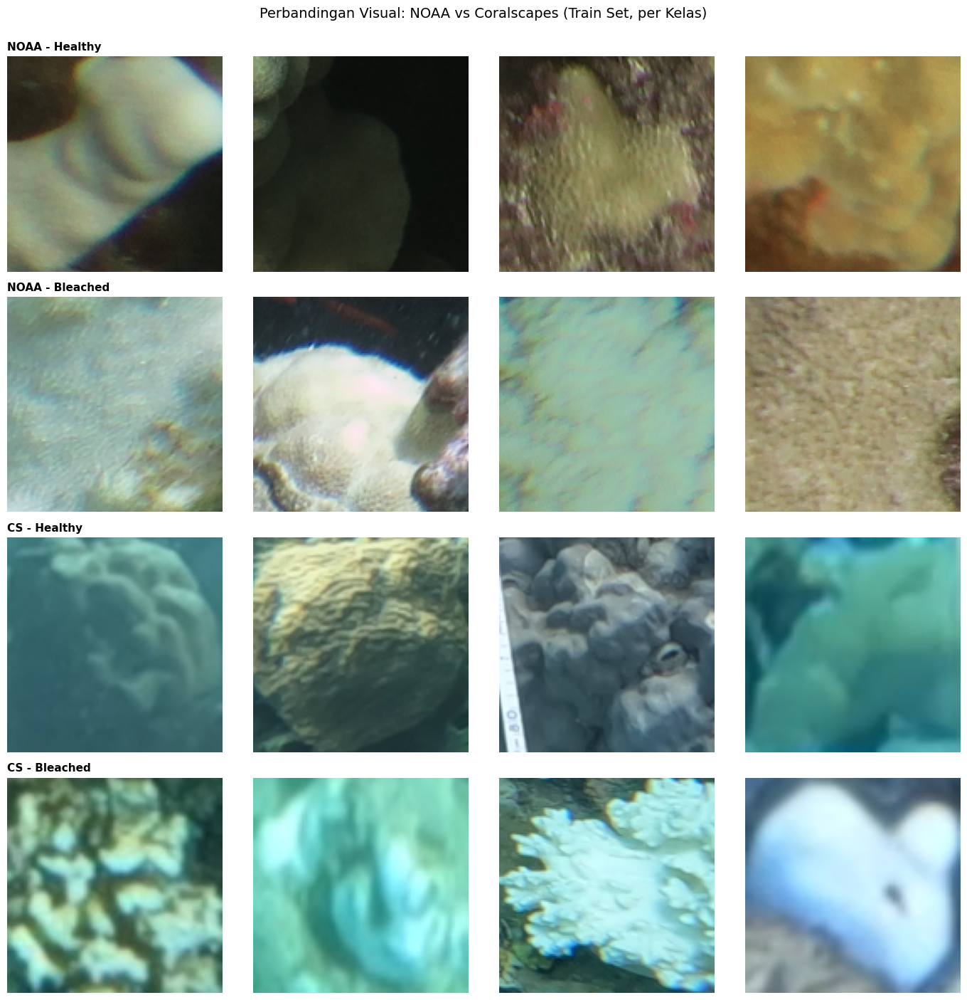


--- Statistik kasar (indikasi domain shift) ---
NOAA Train           | brightness avg: 105.33 | sharpness (blur proxy) avg:   267.53
CS Train             | brightness avg: 123.04 | sharpness (blur proxy) avg:   655.44


In [32]:
# Visualisasi perbandingan sample NOAA vs Coralscapes (cek domain mismatch)
# karena variabel mentah per-sumber sudah dihapus setelah itu.

fig, axes = plt.subplots(4, 4, figsize=(14, 14))

# Ambil index acak dari masing-masing sumber & kelas
noaa_healthy_idx = np.where(y_noaa_train == 0)[0]
noaa_bleached_idx = np.where(y_noaa_train == 1)[0]
cs_healthy_idx = np.where(y_cs_train == 0)[0]
cs_bleached_idx = np.where(y_cs_train == 1)[0]

np.random.seed(42)
samples = {
    "NOAA - Healthy": (X_noaa_train, np.random.choice(noaa_healthy_idx, 4, replace=False)),
    "NOAA - Bleached": (X_noaa_train, np.random.choice(noaa_bleached_idx, 4, replace=False)),
    "CS - Healthy": (X_cs_train, np.random.choice(cs_healthy_idx, 4, replace=False)),
    "CS - Bleached": (X_cs_train, np.random.choice(cs_bleached_idx, 4, replace=False)),
}

for row, (label, (X_src, idxs)) in enumerate(samples.items()):
    for col, idx in enumerate(idxs):
        ax = axes[row, col]
        ax.imshow(X_src[idx])
        ax.set_title(label if col == 0 else "", loc='left', fontsize=11, fontweight='bold')
        ax.axis('off')

plt.suptitle("Perbandingan Visual: NOAA vs Coralscapes (Train Set, per Kelas)", fontsize=14, y=1.0)
plt.tight_layout()
plt.show()

# Tambahan: cek statistik sederhana (rata-rata brightness & sharpness) buat kuantifikasi awal
def quick_stats(X, name):
    gray = np.mean(X, axis=-1)  # rata-rata channel jadi grayscale kasar
    brightness = gray.mean()
    sharpness = np.mean([cv2.Laplacian(img.astype(np.uint8), cv2.CV_64F).var() for img in gray[:200]])  # sample 200 biar cepat
    print(f"{name:20s} | brightness avg: {brightness:6.2f} | sharpness (blur proxy) avg: {sharpness:8.2f}")

print("\n--- Statistik kasar (indikasi domain shift) ---")
quick_stats(X_noaa_train, "NOAA Train")
quick_stats(X_cs_train, "CS Train")

In [33]:
# 1. Cek distribusi sumber (NOAA vs CS) per kelas, per split
import pandas as pd

def source_distribution(y_noaa, y_cs, split_name):
    noaa_healthy = (y_noaa == 0).sum()
    noaa_bleached = (y_noaa == 1).sum()
    cs_healthy = (y_cs == 0).sum()
    cs_bleached = (y_cs == 1).sum()

    total_healthy = noaa_healthy + cs_healthy
    total_bleached = noaa_bleached + cs_bleached

    print(f"\n=== {split_name} ===")
    print(f"Healthy  : NOAA={noaa_healthy:5d} ({noaa_healthy/total_healthy*100:5.1f}%) | "
          f"CS={cs_healthy:5d} ({cs_healthy/total_healthy*100:5.1f}%) | total={total_healthy}")
    print(f"Bleached : NOAA={noaa_bleached:5d} ({noaa_bleached/total_bleached*100:5.1f}%) | "
          f"CS={cs_bleached:5d} ({cs_bleached/total_bleached*100:5.1f}%) | total={total_bleached}")

    return {
        'split': split_name,
        'healthy_noaa_pct': noaa_healthy/total_healthy*100,
        'healthy_cs_pct': cs_healthy/total_healthy*100,
        'bleached_noaa_pct': noaa_bleached/total_bleached*100,
        'bleached_cs_pct': cs_bleached/total_bleached*100,
    }

rows = []
rows.append(source_distribution(y_noaa_train, y_cs_train, "TRAIN"))
rows.append(source_distribution(y_noaa_val, y_cs_val, "VAL"))
rows.append(source_distribution(y_noaa_test, y_cs_test, "TEST"))

df_confound = pd.DataFrame(rows)
print("\n--- Ringkasan ---")
print(df_confound.to_string(index=False))

# Sinyal bahaya: kalau selisih (healthy_noaa_pct - bleached_noaa_pct) > ~15-20 poin,
# itu confounding kuat — model punya insentif belajar "sumber" bukan "status bleaching"
df_confound['confound_gap'] = (df_confound['healthy_noaa_pct'] - df_confound['bleached_noaa_pct']).abs()
print(f"\nGap confounding per split (semakin besar semakin bahaya):")
print(df_confound[['split', 'confound_gap']].to_string(index=False))


=== TRAIN ===
Healthy  : NOAA= 4541 ( 61.9%) | CS= 2799 ( 38.1%) | total=7340
Bleached : NOAA= 2751 ( 69.4%) | CS= 1214 ( 30.6%) | total=3965

=== VAL ===
Healthy  : NOAA=  973 ( 61.9%) | CS=  600 ( 38.1%) | total=1573
Bleached : NOAA=  589 ( 69.4%) | CS=  260 ( 30.6%) | total=849

=== TEST ===
Healthy  : NOAA=  974 ( 61.8%) | CS=  601 ( 38.2%) | total=1575
Bleached : NOAA=  591 ( 69.4%) | CS=  260 ( 30.6%) | total=851

--- Ringkasan ---
split  healthy_noaa_pct  healthy_cs_pct  bleached_noaa_pct  bleached_cs_pct
TRAIN         61.866485       38.133515          69.382093        30.617907
  VAL         61.856325       38.143675          69.375736        30.624264
 TEST         61.841270       38.158730          69.447709        30.552291

Gap confounding per split (semakin besar semakin bahaya):
split  confound_gap
TRAIN      7.515608
  VAL      7.519411
 TEST      7.606439


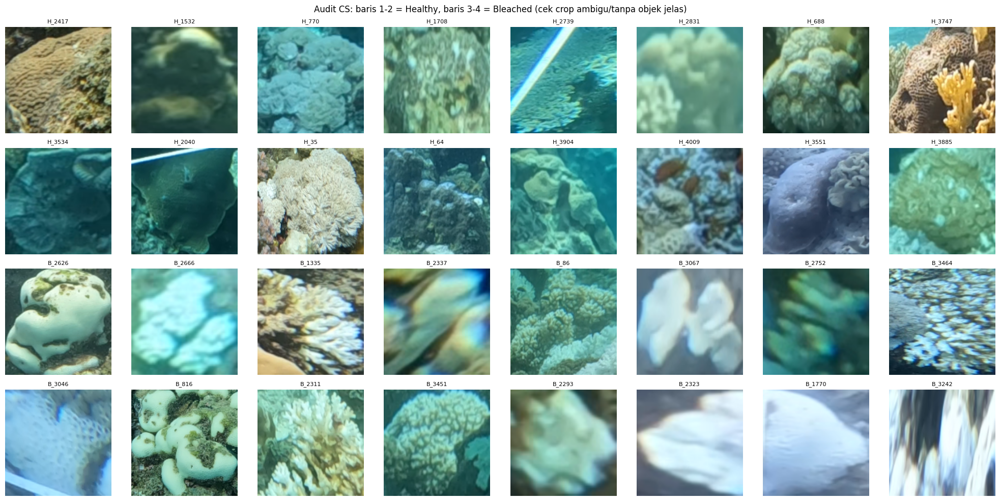

Crop dengan variance terendah (10th percentile, threshold=32.09): 402 dari 4013 sample
Distribusi kelas di antara yang di-flag: Healthy=386, Bleached=16
Total 402 crop di-flag, dibagi jadi 41 halaman (10 gambar/halaman)


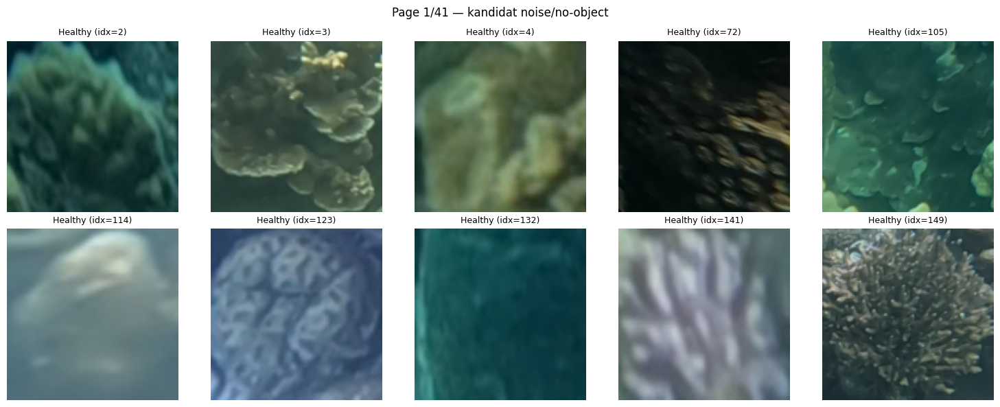

In [34]:
# 2. Tampilkan lebih banyak sample CS per kelas buat audit visual manual
def audit_cs_samples(X_cs, y_cs, n_samples=16, seed=1):
    np.random.seed(seed)
    fig, axes = plt.subplots(4, 8, figsize=(20, 10))

    healthy_idx = np.random.choice(np.where(y_cs == 0)[0], n_samples, replace=False)
    bleached_idx = np.random.choice(np.where(y_cs == 1)[0], n_samples, replace=False)

    for i, idx in enumerate(healthy_idx):
        ax = axes[i // 8, i % 8]
        ax.imshow(X_cs[idx])
        ax.set_title(f"H_{idx}", fontsize=8)
        ax.axis('off')

    for i, idx in enumerate(bleached_idx):
        ax = axes[2 + i // 8, i % 8]
        ax.imshow(X_cs[idx])
        ax.set_title(f"B_{idx}", fontsize=8)
        ax.axis('off')

    plt.suptitle("Audit CS: baris 1-2 = Healthy, baris 3-4 = Bleached (cek crop ambigu/tanpa objek jelas)", fontsize=12)
    plt.tight_layout()
    plt.show()

audit_cs_samples(X_cs_train, y_cs_train, n_samples=16, seed=1)

# Opsional: ukur "rasio objek dominan" via variance warna — crop yang nyaris seragam (air/shadow polos)
# biasanya punya variance rendah, bisa jadi indikasi crop tanpa objek coral jelas
def flag_low_variance_crops(X_cs, y_cs, threshold_percentile=10):
    variances = np.array([img.astype('float32').std() for img in X_cs])
    threshold = np.percentile(variances, threshold_percentile)
    flagged_idx = np.where(variances <= threshold)[0]
    print(f"Crop dengan variance terendah ({threshold_percentile}th percentile, threshold={threshold:.2f}): {len(flagged_idx)} dari {len(X_cs)} sample")
    print(f"Distribusi kelas di antara yang di-flag: Healthy={np.sum(y_cs[flagged_idx]==0)}, Bleached={np.sum(y_cs[flagged_idx]==1)}")
    return flagged_idx

flagged = flag_low_variance_crops(X_cs_train, y_cs_train, threshold_percentile=10)

# Tampilkan beberapa yang di-flag buat dicek manual
# Ganti bagian "sample_flagged" ke sistem pagination
PAGE_SIZE = 10
total_pages = (len(flagged) + PAGE_SIZE - 1) // PAGE_SIZE

def show_flagged_page(page_num, flagged_idx, X_cs, y_cs, page_size=PAGE_SIZE):
    start = page_num * page_size
    end = min(start + page_size, len(flagged_idx))
    page_indices = flagged_idx[start:end]

    n = len(page_indices)
    cols = 5
    rows = (n + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 3*rows))
    axes = axes.flatten() if rows > 1 else [axes] if n == 1 else axes

    for i, idx in enumerate(page_indices):
        ax = axes[i]
        ax.imshow(X_cs[idx])
        label = 'Bleached' if y_cs[idx] == 1 else 'Healthy'
        ax.set_title(f"{label} (idx={idx})", fontsize=9)
        ax.axis('off')

    # Matikan axes kosong kalau jumlah gambar nggak penuh satu grid
    for j in range(n, len(axes)):
        axes[j].axis('off')

    plt.suptitle(f"Page {page_num+1}/{total_pages} — kandidat noise/no-object")
    plt.tight_layout()
    plt.show()

print(f"Total {len(flagged)} crop di-flag, dibagi jadi {total_pages} halaman (10 gambar/halaman)")

# Ganti angka page_num ini tiap mau lanjut ke halaman berikutnya (0, 1, 2, ... sampai total_pages-1)
show_flagged_page(page_num=0, flagged_idx=flagged, X_cs=X_cs_train, y_cs=y_cs_train)

In [35]:
# Setelah liat tiap grid sample_flagged, catat manual index mana yang BENERAN mau dibuang
bad_indices_round1 = [114, 132, 141]
bad_indices_round2 = [207, 205]
bad_indices_round3 = [362, 327]
bad_indices_round4 = [410, 404, 425, 435]
bad_indices_round6 = [699, 575]
bad_indices_round7 = [731, 786, 790]
bad_indices_round8 = [861, 877, 905]
bad_indices_round9 = [942, 947, 955, 959, 926]
bad_indices_round10 = [1086, 1073]
bad_indices_round11 = [1192, 1140, 1181]
bad_indices_round12 = [1228, 1247]
bad_indices_round13 = [1357, 1351, 1356]
bad_indices_round14 = [1424, 1426, 1452, 1456, 1459, 1474]
bad_indices_round15 = [1500, 1603]
bad_indices_round16 = [1681, 1699]
bad_indices_round17 = [1781, 1737, 1810]
bad_indices_round18 = [1914, 1832]
bad_indices_round19 = [1958, 1989, 1991, 1997, 2017]
bad_indices_round20 = [2155, 2156, 2099]
bad_indices_round21 = [2236, 2191]
bad_indices_round22 = [2312, 2319, 2330]
bad_indices_round23 = [2425, 2415, 2393, 2373]
bad_indices_round24 = [2449, 2501]
bad_indices_round25 = [2524, 2553]
bad_indices_round26 = [2659, 2675]
bad_indices_round27 = [2715, 2689, 2699]
bad_indices_round28 = [2819, 2877, 2811, 2806, 2795, 2810, 2851, 2856]
bad_indices_round29 = [2913, 2952, 2973, 2975, 2983, 2986]
bad_indices_round30 = [3011, 3004, 3005, 3082]
bad_indices_round31 = [3125, 3141, 3150, 3154]
bad_indices_round32 = [3227, 3223, 3262, 3245]
bad_indices_round33 = [3332, 3338, 3372, 3306]
bad_indices_round34 = [3382, 3426]
bad_indices_round35 = [3448, 3470, 3497, 3544]
bad_indices_round36 = [3641, 3647]
bad_indices_round37 = [3653, 3654, 3663, 3702]
bad_indices_round38 = [3767, 3769, 3775, 3779]
bad_indices_round39 = [3918, 3924, 3836, 3850, 3829]
bad_indices_round40 = [3990, 3994, 3985]

# Gabungin semua round jadi satu list, otomatis dedup pakai set()
all_rounds = [
    bad_indices_round1, bad_indices_round2, bad_indices_round3, bad_indices_round4,
    bad_indices_round6, bad_indices_round7, bad_indices_round8, bad_indices_round9,
    bad_indices_round10, bad_indices_round11, bad_indices_round12, bad_indices_round13,
    bad_indices_round14, bad_indices_round15, bad_indices_round16, bad_indices_round17,
    bad_indices_round18, bad_indices_round19, bad_indices_round20, bad_indices_round21,
    bad_indices_round22, bad_indices_round23, bad_indices_round24, bad_indices_round25,
    bad_indices_round26, bad_indices_round27, bad_indices_round28, bad_indices_round29,
    bad_indices_round30, bad_indices_round31, bad_indices_round32, bad_indices_round33,
    bad_indices_round34, bad_indices_round35, bad_indices_round36, bad_indices_round37,
    bad_indices_round38, bad_indices_round39, bad_indices_round40,
]

all_bad_indices = list(set(idx for round_list in all_rounds for idx in round_list))
print(f"Total index unik yang akan dibuang: {len(all_bad_indices)}")

# Filter X_cs_train, y_cs_train
mask = np.ones(len(X_cs_train), dtype=bool)
mask[all_bad_indices] = False
X_cs_train_cleaned = X_cs_train[mask]
y_cs_train_cleaned = y_cs_train[mask]

print(f"Sebelum: {len(X_cs_train)} | Sesudah dibersihkan: {len(X_cs_train_cleaned)}")

Total index unik yang akan dibuang: 129
Sebelum: 4013 | Sesudah dibersihkan: 3884


In [36]:
# Hapus pecahan variable yang tidak terpakai
try:
    del X_noaa_train, y_noaa_train, X_cs_train, y_cs_train
    del X_noaa_val, y_noaa_val, X_cs_val, y_cs_val
    del X_noaa_test, y_noaa_test, X_cs_test, y_cs_test
    # Hapus juga objek dataset coralscapes dari Hugging Face jika masih tersimpan di variabel tertentu
except NameError:
    pass

# Mengosongkan RAM
gc.collect()

print("Bentuk akhir data Train (uint8):", X_train_final.shape)
print("Data Preparation Selesai")

Bentuk akhir data Train (uint8): (11305, 128, 128, 3)
Data Preparation Selesai


## 4. Modeling
Membangun arsitektur Custom Convolutional Neural Network (CNN) dari awal tanpa *transfer learning*.

**Karakteristik Model:**
1. **Layer Rescaling:** Mengubah skala piksel secara otomatis dari `0-255` (uint8) menjadi `0-1` (float32) saat proses *training*, sehingga sangat menghemat penggunaan memori RAM.
2. **Feature Extraction:** Terdiri dari 3 blok konvolusi. *Layer* konvolusi terakhir (`last_conv_layer`) disiapkan secara khusus agar nilainya bisa diekstrak oleh algoritma Grad-CAM nanti.
3. **Regularization:** Menggunakan `Dropout` sebesar 50% untuk mencegah *overfitting* pada klasifikasi.

In [37]:
from tensorflow.keras import layers, models, regularizers
import tensorflow as tf

2026-06-30 16:24:52.248869: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1782836692.458085      58 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1782836692.512434      58 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1782836693.001644      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782836693.001668      58 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1782836693.001671      58 computation_placer.cc:177] computation placer alr

In [38]:
# Membuat custom CNN
def build_custom_cnn(input_shape=(128, 128, 3)):
    model = models.Sequential([
        layers.Input(shape=input_shape, name='input_layer'),
        layers.Rescaling(1./255, name='rescaling_layer'),

        # Block 1 (16 filter)
        layers.Conv2D(16, (3,3), padding='same', kernel_regularizer=regularizers.l2(1e-4), name='conv2d_1'),
        layers.BatchNormalization(name='bn_1'),
        layers.Activation('relu', name='relu_1'),
        layers.MaxPooling2D((2,2), name='maxpool_1'),

        # Block 2 (32 filter)
        layers.Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(1e-4), name='conv2d_2'),
        layers.BatchNormalization(name='bn_2'),
        layers.Activation('relu', name='relu_2'),
        layers.MaxPooling2D((2,2), name='maxpool_2'),

        # Block 3 (64 filter) — last conv layer untuk Grad-CAM
        layers.Conv2D(96, (3,3), padding='same', kernel_regularizer=regularizers.l2(1e-4), name='last_conv_layer'),
        layers.BatchNormalization(name='bn_3'),
        layers.Activation('relu', name='relu_3'),
        layers.MaxPooling2D((2,2), name='maxpool_3'),

        # Classification Head
        layers.GlobalAveragePooling2D(name='global_average_pooling'),
        layers.Dropout(0.4, name='dropout_1'),
        layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(1e-4), name='dense_1'),
        layers.Dropout(0.3, name='dropout_2'),
        layers.Dense(1, activation='sigmoid', name='output_layer')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=5e-4),
        loss='binary_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
    )
    return model

# Buat instansiasi model
cnn_model = build_custom_cnn()

# Tampilkan ringkasan arsitektur
cnn_model.summary()

I0000 00:00:1782836705.516456      58 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13756 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1782836705.522338      58 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13756 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_layer (Rescaling)     │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 16)   │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_1 (BatchNormalization)       │ (None, 128, 128, 16)   │            64 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_1 (Activation)             │ (None, 128, 128, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool_1 (MaxPooling2D)        │ (None, 64, 64, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_2 (BatchNormalization)       │ (None, 64, 64, 32)     │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_2 (Activation)             │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool_2 (MaxPooling2D)        │ (None, 32, 32, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ last_conv_layer (Conv2D)        │ (None, 32, 32, 96)     │        27,744 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bn_3 (BatchNormalization)       │ (None, 32, 32, 96)     │           384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ relu_3 (Activation)             │ (None, 32, 32, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ maxpool_3 (MaxPooling2D)        │ (None, 16, 16, 96)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling          │ (None, 96)             │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 39,681 (155.00 KB)

 Trainable params: 39,393 (153.88 KB)

 Non-trainable params: 288 (1.12 KB)

In [39]:
# Menambahkan Augmentasi Data
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np

# Bleached: augmentasi berat (kelas minoritas, butuh diversity buatan lebih)
datagen_bleached = ImageDataGenerator(
    horizontal_flip=True,
    vertical_flip=True,
    rotation_range=20,
    zoom_range=0.15,
    brightness_range=[0.8, 1.2]
)

# Healthy: augmentasi ringan (diversity natural udah cukup, jangan dihilangkan total)
datagen_healthy = ImageDataGenerator(
    horizontal_flip=True
)

bleached_idx = np.where(y_train_final == 1)[0]
healthy_idx = np.where(y_train_final == 0)[0]

def balanced_generator(X, y, bleached_idx, healthy_idx, batch_size=32):
    half = batch_size // 2
    while True:
        b_idx = np.random.choice(bleached_idx, half)
        h_idx = np.random.choice(healthy_idx, half)

        X_b = X[b_idx].astype('float32')
        X_h = X[h_idx].astype('float32')

        for i in range(len(X_b)):
            X_b[i] = datagen_bleached.random_transform(X_b[i])
        for i in range(len(X_h)):
            X_h[i] = datagen_healthy.random_transform(X_h[i])

        X_batch = np.concatenate([X_b, X_h])
        y_batch = np.concatenate([y[b_idx], y[h_idx]])

        idx = np.random.permutation(batch_size)
        yield X_batch[idx], y_batch[idx]

In [40]:
from sklearn.utils import resample

# Balance val set supaya loss-nya stabil
idx_h = np.where(y_val_final == 0)[0]
idx_b = np.where(y_val_final == 1)[0]

# Undersample healthy di val supaya 1:1
idx_h_down = resample(idx_h, n_samples=len(idx_b), random_state=42)
idx_val_balanced = np.concatenate([idx_h_down, idx_b])
np.random.shuffle(idx_val_balanced)

X_val_balanced = X_val_final[idx_val_balanced]
y_val_balanced = y_val_final[idx_val_balanced]

print(f"Val Healthy : {(y_val_balanced==0).sum()}")
print(f"Val Bleached: {(y_val_balanced==1).sum()}")

Val Healthy : 849
Val Bleached: 849


In [41]:
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

print("Memulai proses training model...")

# Menentukan parameter
EPOCHS = 20
BATCH_SIZE = 64

train_gen = balanced_generator(X_train_final, y_train_final, bleached_idx, healthy_idx, batch_size=BATCH_SIZE)
steps = len(X_train_final) // BATCH_SIZE

# Definisikan signature output supaya tf.data tau bentuk & tipe data yang akan datang
output_signature = (
    tf.TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32),
    tf.TensorSpec(shape=(None,), dtype=tf.float32)
)

train_dataset = tf.data.Dataset.from_generator(
    lambda: balanced_generator(X_train_final, y_train_final, bleached_idx, healthy_idx, batch_size=BATCH_SIZE),
    output_signature=output_signature
).prefetch(tf.data.AUTOTUNE)  # prefetch biar CPU augmentasi & GPU training overlap, juga bantu manage memory buffer

# Untuk menyetop training apabila accuracy dan loss-nya konstan di epoch berikutnya
callbacks = [
    EarlyStopping(
        monitor='val_auc',
        patience=6,
        restore_best_weights=True,
        verbose=1
    ),
    ReduceLROnPlateau(
        monitor='val_auc',
        factor=0.3,
        patience=2,
        min_lr=1e-6,
        verbose=1
    )
]

history = cnn_model.fit(
    train_gen,
    steps_per_epoch=steps,
    validation_data=(X_val_balanced, y_val_balanced),
    epochs=EPOCHS,
    callbacks=callbacks
)

print("Proses training selesai!")

Memulai proses training model...
Epoch 1/20


I0000 00:00:1782836709.899290     190 service.cc:152] XLA service 0x7c216001b3c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1782836709.899344     190 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1782836709.899351     190 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1782836710.535927     190 cuda_dnn.cc:529] Loaded cuDNN version 91002
2026-06-30 16:25:12.598581: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
2026-06-30 16:25:12.741198: E external/local_xla/xla/stream_executor/cuda/cuda_timer.cc:86] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


  3/176 ━━━━━━━━━━━━━━━━━━━━ 13s 81ms/step - accuracy: 0.4800 - auc: 0.4969 - loss: 0.8546

I0000 00:00:1782836716.340740     190 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


176/176 ━━━━━━━━━━━━━━━━━━━━ 35s 146ms/step - accuracy: 0.7379 - auc: 0.8119 - loss: 0.5490 - val_accuracy: 0.5018 - val_auc: 0.7969 - val_loss: 0.8194 - learning_rate: 5.0000e-04
Epoch 2/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - accuracy: 0.7768 - auc: 0.8551 - loss: 0.4900 - val_accuracy: 0.5377 - val_auc: 0.8120 - val_loss: 0.8648 - learning_rate: 5.0000e-04
Epoch 3/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - accuracy: 0.7979 - auc: 0.8703 - loss: 0.4696 - val_accuracy: 0.7303 - val_auc: 0.8493 - val_loss: 0.5434 - learning_rate: 5.0000e-04
Epoch 4/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 23s 132ms/step - accuracy: 0.8042 - auc: 0.8781 - loss: 0.4567 - val_accuracy: 0.6808 - val_auc: 0.8552 - val_loss: 0.6774 - learning_rate: 5.0000e-04
Epoch 5/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 23s 133ms/step - accuracy: 0.8216 - auc: 0.8930 - loss: 0.4307 - val_accuracy: 0.5695 - val_auc: 0.8509 - val_loss: 0.8426 - learning_rate: 5.0000e-04
Epoch 6/20
176/176 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step - 

## 5. Evaluation
Mengevaluasi performa model secara **kuantitatif** (Akurasi, Presisi, Recall dengan menggunakan *Classification Report* & *Confusion Matrix*) dan secara **kualitatif** (*Explainable AI* menggunakan Grad-CAM untuk melihat fokus keputusan model).

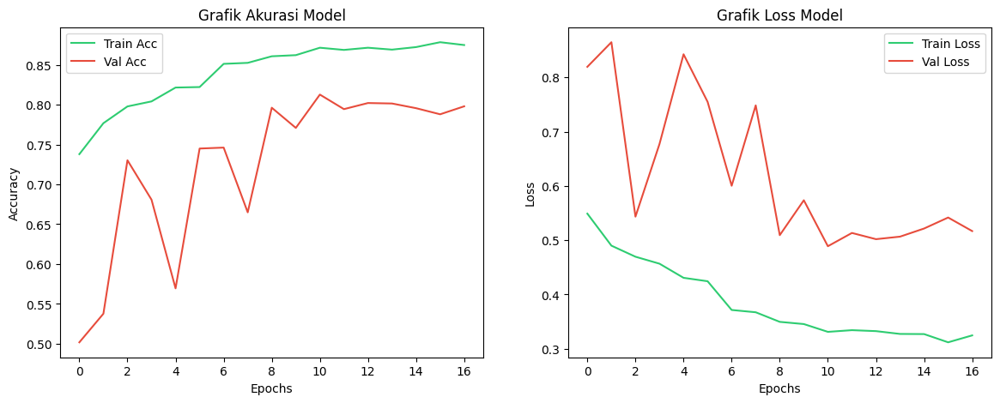

In [42]:
from sklearn.metrics import classification_report, confusion_matrix

# 1. Plot Kurva Accuracy & Loss
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].plot(history.history['accuracy'], label='Train Acc', color='#2ECC71')
ax[0].plot(history.history['val_accuracy'], label='Val Acc', color='#E74C3C')
ax[0].set_title('Grafik Akurasi Model')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend()

ax[1].plot(history.history['loss'], label='Train Loss', color='#2ECC71')
ax[1].plot(history.history['val_loss'], label='Val Loss', color='#E74C3C')
ax[1].set_title('Grafik Loss Model')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend()
plt.show()

In [43]:
# 2. Evaluasi menggunakan Data Test
print("\nEvaluasi pada Data Test")
test_loss, test_acc, test_auc = cnn_model.evaluate(X_test_final, y_test_final, verbose=0)
print(f"Test Accuracy : {test_acc*100:.2f}%")
print(f"Test AUC      : {test_auc:.4f}\n")


Evaluasi pada Data Test
Test Accuracy : 82.03%
Test AUC      : 0.8940



In [44]:
# 3. Prediksi Data Test
y_pred_prob = cnn_model.predict(X_test_final)
y_pred = (y_pred_prob > 0.5).astype(int).flatten()

76/76 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step


Classification Report:
              precision    recall  f1-score   support

     Healthy       0.89      0.82      0.86      1575
    Bleached       0.71      0.82      0.76       851

    accuracy                           0.82      2426
   macro avg       0.80      0.82      0.81      2426
weighted avg       0.83      0.82      0.82      2426



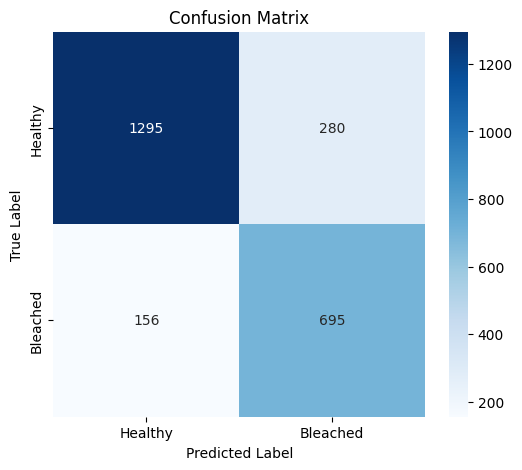

In [45]:
# 4. Classification Report & Confusion Matrix
print("Classification Report:")
print(classification_report(y_test_final, y_pred, target_names=['Healthy', 'Bleached']))

cm = confusion_matrix(y_test_final, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Bleached'],
            yticklabels=['Healthy', 'Bleached'])
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

Dibawah ini visualisasi metode GRAD-CAM untuk mencari tahu bagian gambar mana yang paling berpengaruh terhadap keputusan model

In [46]:
# Import library untuk GRAD-CAM
import tensorflow as tf
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt

In [47]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name):
    img_array = tf.cast(img_array, tf.float32)

    # Cari index last_conv_layer
    layer_names = [l.name for l in model.layers]
    conv_idx = layer_names.index(last_conv_layer_name)

    # Split layers manual berdasarkan index
    pre_conv_layers = model.layers[:conv_idx + 1]   # sampai last_conv_layer (inklusif)
    post_conv_layers = model.layers[conv_idx + 1:]  # sisanya

    with tf.GradientTape() as tape:
        # Forward pass sampai conv layer
        x = img_array
        for layer in pre_conv_layers:
            x = layer(x)
        conv_output = x
        tape.watch(conv_output)

        # Forward pass sisa layer
        for layer in post_conv_layers:
            x = layer(x)
        preds = x

        class_channel = preds[:, 0]

    grads = tape.gradient(class_channel, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    heatmap = conv_output[0] @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [48]:
def visualize_gradcam(index):
    img = X_test_final[index]
    true_label = int(y_test_final[index])

    # Tambahkan dimensi batch dan cast ke float32 untuk tf.GradientTape
    img_array = np.expand_dims(img, axis=0)
    img_tensor = tf.cast(img_array, tf.float32)

    # Dapatkan prediksi probabilitas
    pred_prob = cnn_model.predict(img_tensor, verbose=0)[0][0]
    pred_label = 1 if pred_prob > 0.5 else 0

    # Buat Heatmap
    heatmap = make_gradcam_heatmap(img_tensor, cnn_model, 'last_conv_layer')

    # Resize heatmap ke ukuran gambar asli
    heatmap_resized = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    heatmap_color = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Gabungkan dengan gambar asli (Superimposed)
    img_uint8 = np.uint8(img)
    superimposed_img = cv2.addWeighted(heatmap_color, 0.4, img_uint8, 0.6, 0)

    # Plotting
    str_true = 'Bleached' if true_label==1 else 'Healthy'
    str_pred = 'Bleached' if pred_label==1 else 'Healthy'

    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    fig.suptitle(f"True: {str_true} | Pred: {str_pred} (Prob: {pred_prob:.4f})", fontsize=14)

    ax[0].imshow(img_uint8)
    ax[0].set_title("Original Image")
    ax[0].axis('off')

    ax[1].imshow(heatmap_color)
    ax[1].set_title("Grad-CAM Heatmap")
    ax[1].axis('off')

    ax[2].imshow(superimposed_img)
    ax[2].set_title("Superimposed")
    ax[2].axis('off')

    plt.show()

Menampilkan Grad-CAM untuk sampel acak dari Data Test...


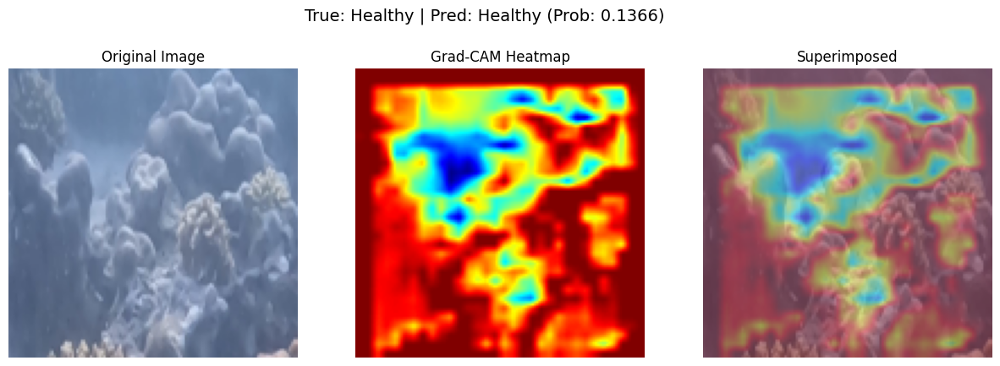

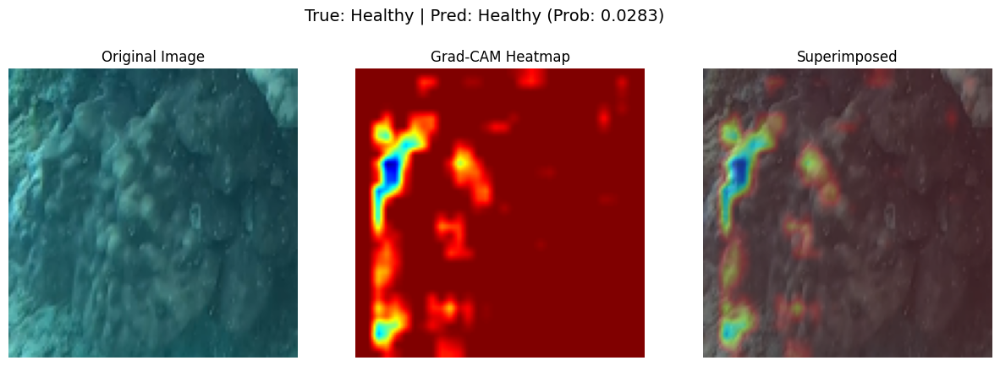

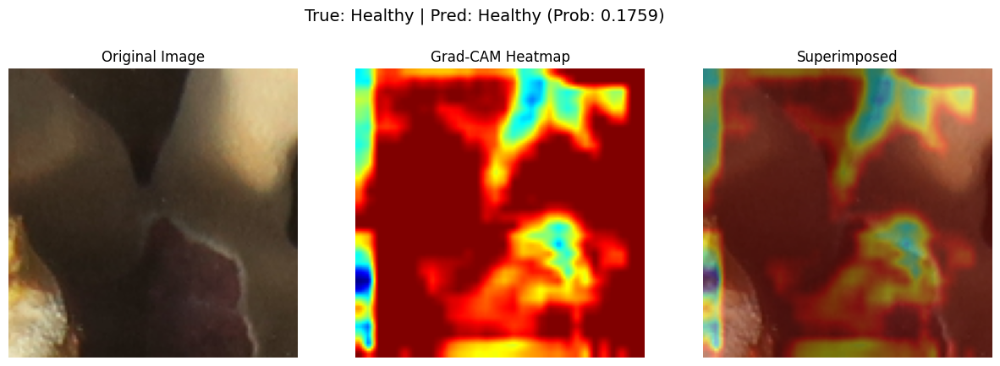

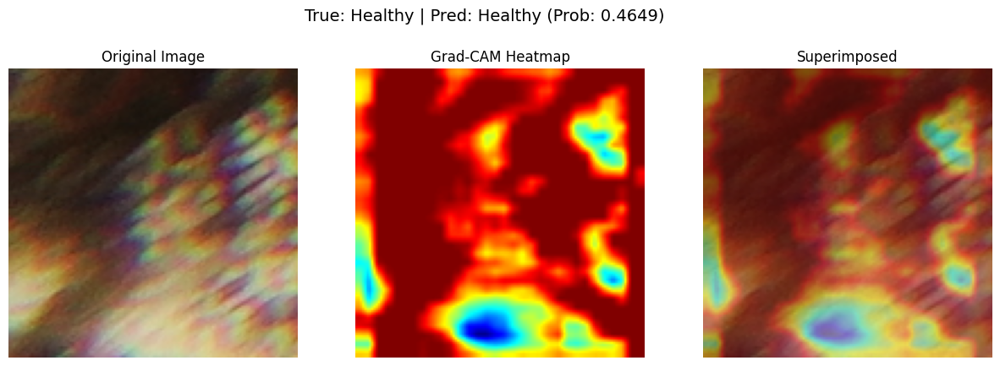

In [49]:
# menguji pada 4 gambar
print("Menampilkan Grad-CAM untuk sampel acak dari Data Test...")
for _ in range(4):
    random_idx = random.randint(0, len(X_test_final) - 1)
    visualize_gradcam(random_idx)

Estimasi pemutihan terumbu karang berdasarkan warna di piksel gambar

In [50]:
# Fungsi estimasi bleaching
def estimate_bleaching_percentage(img):
    """
    Estimasi persentase area bleaching berdasarkan warna putih/pucat.
    img: numpy array (128, 128, 3) uint8, RGB
    """
    # Konversi ke HSV
    img_hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

    # Threshold warna putih/pucat (low saturation, high value)
    lower = np.array([0, 0, 170])    # HSV lower bound
    upper = np.array([180, 60, 255]) # HSV upper bound

    mask = cv2.inRange(img_hsv, lower, upper)
    bleached_pixels = np.sum(mask > 0)
    total_pixels = mask.size

    return (bleached_pixels / total_pixels) * 100

In [51]:
# fungsi untuk memvisualisasikannya
def visualize_gradcam_with_percentage(index):
    img = X_test_final[index]
    true_label = int(y_test_final[index])

    img_array = np.expand_dims(img, axis=0)
    img_tensor = tf.cast(img_array, tf.float32)

    pred_prob = cnn_model.predict(img_tensor, verbose=0)[0][0]
    pred_label = 1 if pred_prob > 0.5 else 0

    heatmap = make_gradcam_heatmap(img_tensor, cnn_model, 'last_conv_layer')
    heatmap_resized = cv2.resize(heatmap, (128, 128))
    heatmap_colored = np.uint8(255 * heatmap_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_colored, cv2.COLORMAP_JET)
    heatmap_colored = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    superimposed = cv2.addWeighted(img, 0.6, heatmap_colored, 0.4, 0)

    # Hitung persentase bleaching
    bleach_pct = estimate_bleaching_percentage(img)

    str_true = 'Healthy' if true_label == 0 else 'Bleached'
    str_pred = 'Healthy' if pred_label == 0 else 'Bleached'

    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    fig.suptitle(
        f"True: {str_true} | Pred: {str_pred} (Prob: {pred_prob:.4f})\n"
        f"Estimasi Area Bleaching: {bleach_pct:.1f}%",
        fontsize=13
    )

    axes[0].imshow(img)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(heatmap_resized, cmap='jet')
    axes[1].set_title("Grad-CAM Heatmap")
    axes[1].axis('off')

    axes[2].imshow(superimposed)
    axes[2].set_title("Superimposed")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()

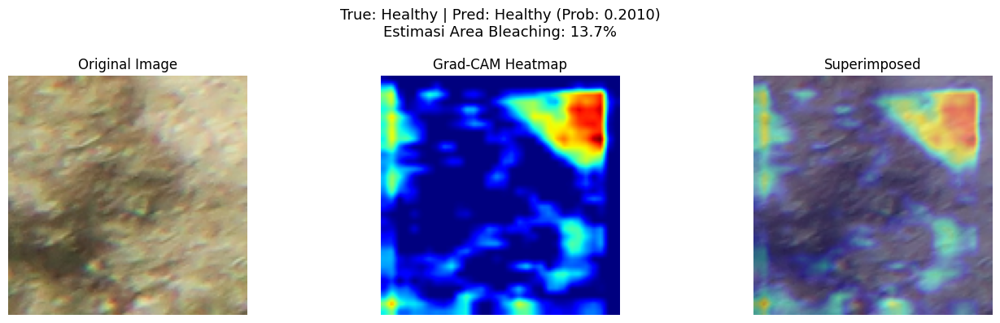

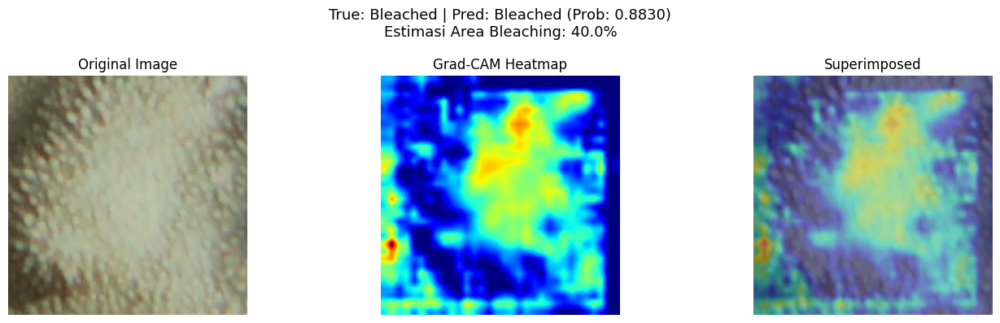

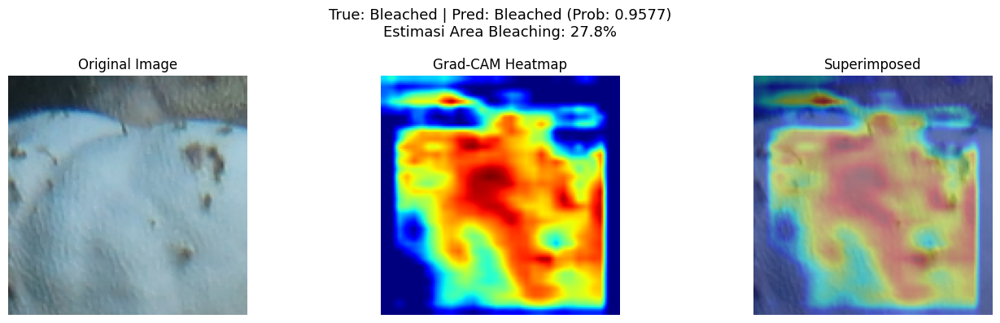

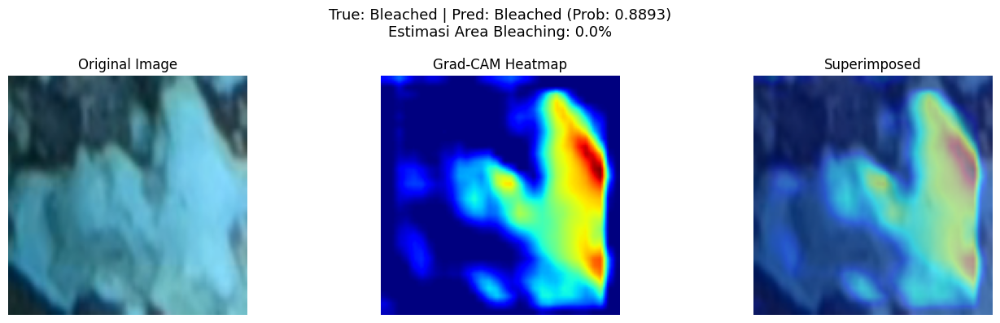

In [52]:
# Test
import random
for _ in range(4):
    random_idx = random.randint(0, len(X_test_final) - 1)
    visualize_gradcam_with_percentage(random_idx)

In [53]:
# Cek distribusi prediksi di seluruh test set
import numpy as np
y_pred_all = cnn_model.predict(X_test_final.astype('float32'), verbose=0)
print("Min prob:", y_pred_all.min())
print("Max prob:", y_pred_all.max())
print("Mean prob:", y_pred_all.mean())
print("Pred > 0.5:", (y_pred_all > 0.5).sum(), "dari", len(y_pred_all))

# Cek distribusi label test
unique, counts = np.unique(y_test_final, return_counts=True)
print("Label distribution:", dict(zip(unique, counts)))

Min prob: 9.120762e-07
Max prob: 0.9997687
Mean prob: 0.42332122
Pred > 0.5: 975 dari 2426
Label distribution: {np.float32(0.0): np.int64(1575), np.float32(1.0): np.int64(851)}


Simpan Model ke Google Drive

In [54]:
save_dir = "/kaggle/working/"
os.makedirs(save_dir, exist_ok=True)

# Simpan model
model_path = os.path.join(save_dir, "cnn_coral_bleaching_(new).keras")
cnn_model.save(model_path)

print(f"Model berhasil disimpan di: {model_path}")

Model berhasil disimpan di: /kaggle/working/cnn_coral_bleaching_(new).keras
